Your company now sees all the big companies creating original video content and they want to get in on the fun. They have decided to create a new movie studio, but they don’t know anything about creating movies. You are charged with exploring what types of films are currently doing the best at the box office. You must then translate those findings into actionable insights that the head of your company's new movie studio can use to help decide what type of films to create.



# Business Understanding

This project aims to identifying the best film to create for a startup company.

# Main agenda 
Knowing the best films for a startup company

# Dataset 
Various dataset are used in getting the right information and to avoid biaseness.
        [LINKS](https://github.com/learn-co-curriculum/dsc-phase-2-project-v3/tree/main/zippedData)




# Objective

1. genre - which genre has more potential
2. costs - which type of film is profitable
3. rating -which rated movie performs best
4. runtime - which length performs best
5. region - which region perfomrs best

In [ ]:
# importing necessary libraires
import pandas as pd # Data analysis and data manipulation
import numpy as np # Scientific Computing
import matplotlib.pyplot as plt # Visualisations
import seaborn as sns #  Advanced visualisations
import sqlite3 # for reading sql 
import plotly.express as px #  Advanced visualisations

Loading various dataset to be used 

pd.read_csv -  is for reading the csv and txt files

                For txt file1 1. encoding= 'latin1' is used to - Correct interpretation of characters
                              2. sep = '\t' is used to - Horizontal tap space
                            

In [ ]:
# Creating a variable of the read csv file
movie_gross = pd.read_csv(r"C:\Users\Jeremy\Desktop\ds\moringa\phase 2\project\bom.movie_gross.csv\bom.movie_gross.csv")
movie_gross # Getting the  rows of the datset

,title,studio,domestic_gross,foreign_gross,year
0,Toy Story 3,BV,415000000.0,652000000,2010
1,Alice in Wonderland (2010),BV,334200000.0,691300000,2010
2,Harry Potter and the Deathly Hallows Part 1,WB,296000000.0,664300000,2010
3,Inception,WB,292600000.0,535700000,2010
4,Shrek Forever After,P/DW,238700000.0,513900000,2010
...,...,...,...,...,...
3382,The Quake,Magn.,6200.0,NaN,2018
3383,Edward II (2018 re-release),FM,4800.0,NaN,2018
3384,El Pacto,Sony,2500.0,NaN,2018
3385,The Swan,Synergetic,2400.0,NaN,2018


In [ ]:
# Creating a variable of the read csv file
movie_info = pd.read_csv(r"C:\Users\Jeremy\Desktop\ds\moringa\phase 2\project\rt.movie_info.tsv\rt.movie_info.tsv", encoding='latin1', sep= '\t')

movie_info # Getting the rows of the dataset

,id,synopsis,rating,genre,director,writer,theater_date,dvd_date,currency,box_office,runtime,studio
0,1,"This gritty, fast-paced, and innovative police...",R,Action and Adventure|Classics|Drama,William Friedkin,Ernest Tidyman,"Oct 9, 1971","Sep 25, 2001",NaN,NaN,104 minutes,NaN
1,3,"New York City, not-too-distant-future: Eric Pa...",R,Drama|Science Fiction and Fantasy,David Cronenberg,David Cronenberg|Don DeLillo,"Aug 17, 2012","Jan 1, 2013",$,"600,000",108 minutes,Entertainment One
2,5,Illeana Douglas delivers a superb performance ...,R,Drama|Musical and Performing Arts,Allison Anders,Allison Anders,"Sep 13, 1996","Apr 18, 2000",NaN,NaN,116 minutes,NaN
3,6,Michael Douglas runs afoul of a treacherous su...,R,Drama|Mystery and Suspense,Barry Levinson,Paul Attanasio|Michael Crichton,"Dec 9, 1994","Aug 27, 1997",NaN,NaN,128 minutes,NaN
4,7,NaN,NR,Drama|Romance,Rodney Bennett,Giles Cooper,NaN,NaN,NaN,NaN,200 minutes,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1555,1996,Forget terrorists or hijackers -- there's a ha...,R,Action and Adventure|Horror|Mystery and Suspense,NaN,NaN,"Aug 18, 2006","Jan 2, 2007",$,"33,886,034",106 minutes,New Line Cinema
1556,1997,The popular Saturday Night Live sketch was exp...,PG,Comedy|Science Fiction and Fantasy,Steve Barron,Terry Turner|Tom Davis|Dan Aykroyd|Bonnie Turner,"Jul 23, 1993","Apr 17, 2001",NaN,NaN,88 minutes,Paramount Vantage
1557,1998,"Based on a novel by Richard Powell, when the l...",G,Classics|Comedy|Drama|Musical and Performing Arts,Gordon Douglas,NaN,"Jan 1, 1962","May 11, 2004",NaN,NaN,111 minutes,NaN
1558,1999,The Sandlot is a coming-of-age story about a g...,PG,Comedy|Drama|Kids and Family|Sports and Fitness,David Mickey Evans,David Mickey Evans|Robert Gunter,"Apr 1, 1993","Jan 29, 2002",NaN,NaN,101 minutes,NaN


In [ ]:
# Creating a variable of the read csv file
movie_info = pd.read_csv(r"C:\Users\Jeremy\Desktop\ds\moringa\phase 2\project\rt.movie_info.tsv\rt.movie_info.tsv", encoding='latin1', sep= '\t')

movie_info # Getting the rows of the dataset

,id,synopsis,rating,genre,director,writer,theater_date,dvd_date,currency,box_office,runtime,studio
0,1,"This gritty, fast-paced, and innovative police...",R,Action and Adventure|Classics|Drama,William Friedkin,Ernest Tidyman,"Oct 9, 1971","Sep 25, 2001",NaN,NaN,104 minutes,NaN
1,3,"New York City, not-too-distant-future: Eric Pa...",R,Drama|Science Fiction and Fantasy,David Cronenberg,David Cronenberg|Don DeLillo,"Aug 17, 2012","Jan 1, 2013",$,"600,000",108 minutes,Entertainment One
2,5,Illeana Douglas delivers a superb performance ...,R,Drama|Musical and Performing Arts,Allison Anders,Allison Anders,"Sep 13, 1996","Apr 18, 2000",NaN,NaN,116 minutes,NaN
3,6,Michael Douglas runs afoul of a treacherous su...,R,Drama|Mystery and Suspense,Barry Levinson,Paul Attanasio|Michael Crichton,"Dec 9, 1994","Aug 27, 1997",NaN,NaN,128 minutes,NaN
4,7,NaN,NR,Drama|Romance,Rodney Bennett,Giles Cooper,NaN,NaN,NaN,NaN,200 minutes,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1555,1996,Forget terrorists or hijackers -- there's a ha...,R,Action and Adventure|Horror|Mystery and Suspense,NaN,NaN,"Aug 18, 2006","Jan 2, 2007",$,"33,886,034",106 minutes,New Line Cinema
1556,1997,The popular Saturday Night Live sketch was exp...,PG,Comedy|Science Fiction and Fantasy,Steve Barron,Terry Turner|Tom Davis|Dan Aykroyd|Bonnie Turner,"Jul 23, 1993","Apr 17, 2001",NaN,NaN,88 minutes,Paramount Vantage
1557,1998,"Based on a novel by Richard Powell, when the l...",G,Classics|Comedy|Drama|Musical and Performing Arts,Gordon Douglas,NaN,"Jan 1, 1962","May 11, 2004",NaN,NaN,111 minutes,NaN
1558,1999,The Sandlot is a coming-of-age story about a g...,PG,Comedy|Drama|Kids and Family|Sports and Fitness,David Mickey Evans,David Mickey Evans|Robert Gunter,"Apr 1, 1993","Jan 29, 2002",NaN,NaN,101 minutes,NaN


In [ ]:
# Creating a variable of the read csv file
movies = pd.read_csv(r"C:\Users\Jeremy\Desktop\ds\moringa\phase 2\project\tmdb.movies.csv\tmdb.movies.csv", index_col= 'id')# Setting the index column to be id

movies # Getting the rows of the dataset

,Unnamed: 0,genre_ids,original_language,original_title,popularity,release_date,title,vote_average,vote_count
id,,,,,,,,,
12444,0,"[12, 14, 10751]",en,Harry Potter and the Deathly Hallows: Part 1,33.533,2010-11-19,Harry Potter and the Deathly Hallows: Part 1,7.7,10788
10191,1,"[14, 12, 16, 10751]",en,How to Train Your Dragon,28.734,2010-03-26,How to Train Your Dragon,7.7,7610
10138,2,"[12, 28, 878]",en,Iron Man 2,28.515,2010-05-07,Iron Man 2,6.8,12368
862,3,"[16, 35, 10751]",en,Toy Story,28.005,1995-11-22,Toy Story,7.9,10174
27205,4,"[28, 878, 12]",en,Inception,27.920,2010-07-16,Inception,8.3,22186
...,...,...,...,...,...,...,...,...,...
488143,26512,"[27, 18]",en,Laboratory Conditions,0.600,2018-10-13,Laboratory Conditions,0.0,1
485975,26513,"[18, 53]",en,_EXHIBIT_84xxx_,0.600,2018-05-01,_EXHIBIT_84xxx_,0.0,1
381231,26514,"[14, 28, 12]",en,The Last One,0.600,2018-10-01,The Last One,0.0,1


In [ ]:
# Creating a variable of the read csv file
budget = pd.read_csv(r"C:\Users\Jeremy\Desktop\ds\moringa\phase 2\project\tn.movie_budgets.csv\tn.movie_budgets.csv")

budget # Getting the rows of the datset

,id,release_date,movie,production_budget,domestic_gross,worldwide_gross
0,1,"Dec 18, 2009",Avatar,"$425,000,000","$760,507,625","$2,776,345,279"
1,2,"May 20, 2011",Pirates of the Caribbean: On Stranger Tides,"$410,600,000","$241,063,875","$1,045,663,875"
2,3,"Jun 7, 2019",Dark Phoenix,"$350,000,000","$42,762,350","$149,762,350"
3,4,"May 1, 2015",Avengers: Age of Ultron,"$330,600,000","$459,005,868","$1,403,013,963"
4,5,"Dec 15, 2017",Star Wars Ep. VIII: The Last Jedi,"$317,000,000","$620,181,382","$1,316,721,747"
...,...,...,...,...,...,...
5777,78,"Dec 31, 2018",Red 11,"$7,000",$0,$0
5778,79,"Apr 2, 1999",Following,"$6,000","$48,482","$240,495"
5779,80,"Jul 13, 2005",Return to the Land of Wonders,"$5,000","$1,338","$1,338"
5780,81,"Sep 29, 2015",A Plague So Pleasant,"$1,400",$0,$0


conn - To connect the sqlite database to python

cur - Enables python to interact with sqlite

pd.read_sql - id for the reading the sql file


In [ ]:
conn = sqlite3.connect(r"C:\Users\Jeremy\Desktop\ds\moringa\phase 2\project\im.db\im.db")
cur = conn.cursor() 
im = pd.read_sql(''' SELECT name 
                 FROM sqlite_master
                  WHERE type = 'table' ''', conn) # To get all tables in im database

im # Calling the the varible to get all tables in the database

,name
0,movie_basics
1,directors
2,known_for
3,movie_akas
4,movie_ratings
5,persons
6,principals
7,writers


Data exploration on the dataset created 

        1. Getting to know the dataset
        2. Cleaning the dataset

### 1. Movie_gross 

In [ ]:
# Getting the first 5 rows of the movie_gross dataframe
movie_gross.head()

,title,studio,domestic_gross,foreign_gross,year
0,Toy Story 3,BV,415000000.0,652000000,2010
1,Alice in Wonderland (2010),BV,334200000.0,691300000,2010
2,Harry Potter and the Deathly Hallows Part 1,WB,296000000.0,664300000,2010
3,Inception,WB,292600000.0,535700000,2010
4,Shrek Forever After,P/DW,238700000.0,513900000,2010
...,...,...,...,...,...
3382,The Quake,Magn.,6200.0,NaN,2018
3383,Edward II (2018 re-release),FM,4800.0,NaN,2018
3384,El Pacto,Sony,2500.0,NaN,2018
3385,The Swan,Synergetic,2400.0,NaN,2018


In [148]:
# Getting infomation of the datset
movie_gross.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3387 entries, 0 to 3386
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   title           3387 non-null   object 
 1   studio          3382 non-null   object 
 2   domestic_gross  3359 non-null   float64
 3   foreign_gross   2037 non-null   object 
 4   year            3387 non-null   int64  
dtypes: float64(1), int64(1), object(3)
memory usage: 132.4+ KB


Information of the movie_gross dataset

    1. 3387 rows
    2. 4 columns
    3. Missing values on multiple columns
            (a) studio - 5
            (b) domestic_gross - 28 
            (c) foreign_gross - 1350
    4. Data types of the columns


In [149]:
# Getting statistical summary of the datset
movie_gross.describe()

,domestic_gross,year
count,3.359000e+03,3387.000000
mean,2.874585e+07,2013.958075
std,6.698250e+07,2.478141
min,1.000000e+02,2010.000000
25%,1.200000e+05,2012.000000
50%,1.400000e+06,2014.000000
75%,2.790000e+07,2016.000000
max,9.367000e+08,2018.000000


# Checking for duplicates

In [150]:
# Checking for dupliacted rows
movie_gross.duplicated().value_counts() # There are no duplicated rows 

False    3387
dtype: int64

# Cleaning the datset

In [373]:
# To get the number of missing value in the domestic_gross column
movie_gross['domestic_gross'].isna().value_counts()

False    3359
True       28
Name: domestic_gross, dtype: int64

In [374]:
# Saving the indexes of the missing value in a new variable
index_nan = movie_gross[movie_gross['domestic_gross'].isna()].index

# Calling the variable
index_nan

Int64Index([ 230,  298,  302,  306,  327,  537,  713,  871,  928,  933,  936,
             966, 1017, 1079, 1268, 1308, 1340, 1342, 1368, 1659, 1681, 1685,
            1739, 1975, 2392, 2468, 2595, 2825],
           dtype='int64')

In [376]:
# Dropping all rows with missing values in the domestic_gross column
movie_gross.drop(index= index_nan, inplace= True)

# 2. Movies

In [ ]:
# Getting the datframe of the movies dataset
movies

,Unnamed: 0,genre_ids,original_language,original_title,popularity,release_date,title,vote_average,vote_count
id,,,,,,,,,
12444,0,"[12, 14, 10751]",en,Harry Potter and the Deathly Hallows: Part 1,33.533,2010-11-19,Harry Potter and the Deathly Hallows: Part 1,7.7,10788
10191,1,"[14, 12, 16, 10751]",en,How to Train Your Dragon,28.734,2010-03-26,How to Train Your Dragon,7.7,7610
10138,2,"[12, 28, 878]",en,Iron Man 2,28.515,2010-05-07,Iron Man 2,6.8,12368
862,3,"[16, 35, 10751]",en,Toy Story,28.005,1995-11-22,Toy Story,7.9,10174
27205,4,"[28, 878, 12]",en,Inception,27.920,2010-07-16,Inception,8.3,22186
...,...,...,...,...,...,...,...,...,...
488143,26512,"[27, 18]",en,Laboratory Conditions,0.600,2018-10-13,Laboratory Conditions,0.0,1
485975,26513,"[18, 53]",en,_EXHIBIT_84xxx_,0.600,2018-05-01,_EXHIBIT_84xxx_,0.0,1
381231,26514,"[14, 28, 12]",en,The Last One,0.600,2018-10-01,The Last One,0.0,1


In [154]:
# Getting information about the dataset
movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26517 entries, 12444 to 309885
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         26517 non-null  int64  
 1   genre_ids          26517 non-null  object 
 2   original_language  26517 non-null  object 
 3   original_title     26517 non-null  object 
 4   popularity         26517 non-null  float64
 5   release_date       26517 non-null  object 
 6   title              26517 non-null  object 
 7   vote_average       26517 non-null  float64
 8   vote_count         26517 non-null  int64  
dtypes: float64(2), int64(2), object(5)
memory usage: 2.0+ MB


Information about the database

        1. 26517 rows
        2. 9 columns
        3. 0 missing values
        4. Data types of the columns

In [155]:
# Getting statistical summary of the dataset
movies.describe()

,Unnamed: 0,popularity,vote_average,vote_count
count,26517.00000,26517.000000,26517.000000,26517.000000
mean,13258.00000,3.130912,5.991281,194.224837
std,7654.94288,4.355229,1.852946,960.961095
min,0.00000,0.600000,0.000000,1.000000
25%,6629.00000,0.600000,5.000000,2.000000
50%,13258.00000,1.374000,6.000000,5.000000
75%,19887.00000,3.694000,7.000000,28.000000
max,26516.00000,80.773000,10.000000,22186.000000


# Cleaning the dataset

In [156]:
# Dropping column
movies.drop(columns= 'Unnamed: 0', inplace= True)# Dropping because it the default index of the dataset and does not hold any value

In [157]:
# Sorting the index in an ascending order
movies.sort_index(ascending= True, inplace= True)

In [ ]:
# Getting the first 5 rows
movies.head()

,genre_ids,original_language,original_title,popularity,release_date,title,vote_average,vote_count
id,,,,,,,,
27,"[18, 10402, 10749]",en,9 Songs,10.332,2004-09-09,9 Songs,4.9,170
62,"[878, 9648, 12]",en,2001: A Space Odyssey,23.781,1968-04-10,2001: A Space Odyssey,8.0,5837
90,"[28, 35, 80]",en,Beverly Hills Cop,15.067,1984-11-30,Beverly Hills Cop,7.1,1827
93,"[80, 18, 9648, 53]",en,Anatomy of a Murder,12.710,1959-07-01,Anatomy of a Murder,7.9,359
95,"[28, 53, 878, 12]",en,Armageddon,15.799,1998-07-01,Armageddon,6.7,4267
...,...,...,...,...,...,...,...,...
607044,[35],en,The Penguins of Madagascar: Operation N-W.O.R.D.,0.840,2018-10-16,The Penguins of Madagascar: Operation N-W.O.R.D.,8.0,1
607721,[],en,Adventures of a Pizza Guy,1.483,2015-05-30,Adventures of a Pizza Guy,6.0,1
607777,"[53, 9648, 80]",en,Door to Door,0.706,2018-12-10,Door to Door,10.0,1


In [159]:
# Checking the different types of languages
movies['original_language'].value_counts()

en    23291
fr      507
es      455
ru      298
ja      265
      ...  
ha        1
bo        1
kk        1
si        1
cr        1
Name: original_language, Length: 76, dtype: int64

<AxesSubplot:title={'center':'Top 10 most used Original Language'}, xlabel='language', ylabel='count'>

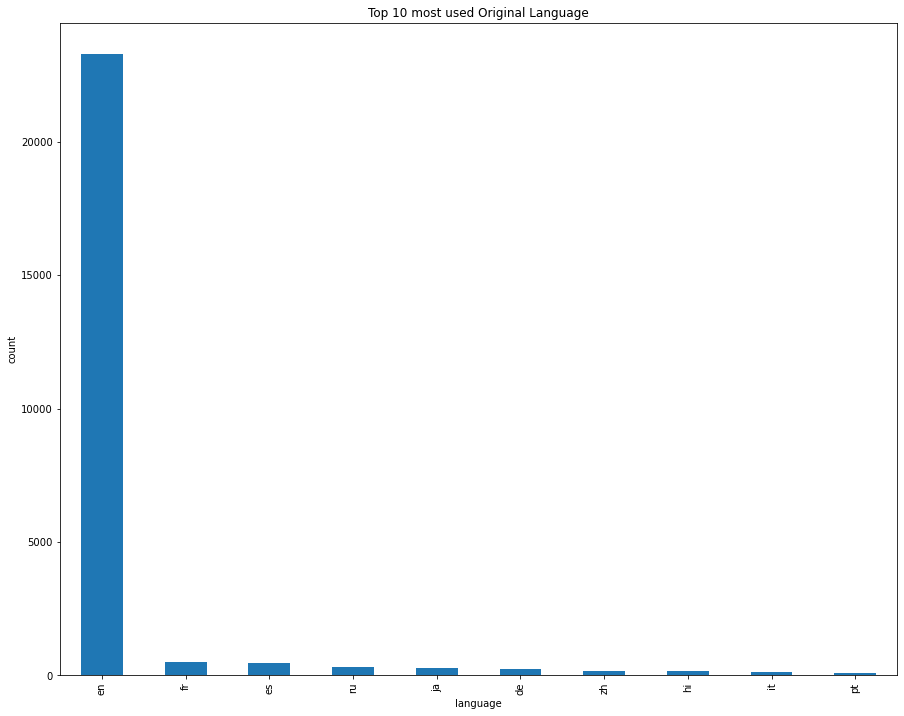

In [160]:
# Comparing the top 10 most used langauges in movies
movies['original_language'].value_counts().nlargest(n= 10).plot(kind= 'bar',
                                                figsize=(15,12),
                                                title= 'Top 10 most used Original Language',
                                                xlabel= 'language',
                                                ylabel= 'count')

# 3. Budget

In [ ]:
# Getting the dataframe of the budget dataset
budget

,id,release_date,movie,production_budget,domestic_gross,worldwide_gross
0,1,"Dec 18, 2009",Avatar,"$425,000,000","$760,507,625","$2,776,345,279"
1,2,"May 20, 2011",Pirates of the Caribbean: On Stranger Tides,"$410,600,000","$241,063,875","$1,045,663,875"
2,3,"Jun 7, 2019",Dark Phoenix,"$350,000,000","$42,762,350","$149,762,350"
3,4,"May 1, 2015",Avengers: Age of Ultron,"$330,600,000","$459,005,868","$1,403,013,963"
4,5,"Dec 15, 2017",Star Wars Ep. VIII: The Last Jedi,"$317,000,000","$620,181,382","$1,316,721,747"
...,...,...,...,...,...,...
5777,78,"Dec 31, 2018",Red 11,"$7,000",$0,$0
5778,79,"Apr 2, 1999",Following,"$6,000","$48,482","$240,495"
5779,80,"Jul 13, 2005",Return to the Land of Wonders,"$5,000","$1,338","$1,338"
5780,81,"Sep 29, 2015",A Plague So Pleasant,"$1,400",$0,$0


In [164]:
# Getting information about the dataset
budget.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5782 entries, 0 to 5781
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   id                 5782 non-null   int64 
 1   release_date       5782 non-null   object
 2   movie              5782 non-null   object
 3   production_budget  5782 non-null   object
 4   domestic_gross     5782 non-null   object
 5   worldwide_gross    5782 non-null   object
dtypes: int64(1), object(5)
memory usage: 271.2+ KB


Inforamtion about the dataset

        1. 5782 rows
        2. 6 columns
        3. 0 missing values
        4. Data types of the columns

In [166]:
# To remove the dollar sign from the 'production_budget' column
budget['production_budget'] = budget['production_budget'].str.replace('$', '')

# To remove comma from the 'production_budget' column
budget['production_budget'] = budget['production_budget'].str.replace(',', '')

# Chnaging the datatype of 'production_budget' column
budget['production_budget'] = budget['production_budget'].astype(float)

In [167]:
# To remove the dollar sign from the 'domestic_gross' column
budget['domestic_gross'] = budget['domestic_gross'].str.replace('$', '')

# To remove comma from the 'domestic_gross' column
budget['domestic_gross'] = budget['domestic_gross'].str.replace(',', '')

# Chnaging the datatype of 'domestic_gross' column
budget['domestic_gross'] = budget['domestic_gross'].astype(float)

In [168]:
# To remove the dollar sign from the 'worldwide_gross' column
budget['worldwide_gross'] = budget['worldwide_gross'].str.replace('$', '',  regex= False)

# To remove comma from the 'worldwide_gross' column
budget['worldwide_gross'] = budget['worldwide_gross'].str.replace(',', '', regex= False)

# Chnaging the datatype of 'worldwide_gross' column
budget['worldwide_gross'] = budget['worldwide_gross'].astype(float)

In [170]:
# Getting the information of the dataset after changes
budget.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5782 entries, 0 to 5781
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5782 non-null   int64  
 1   release_date       5782 non-null   object 
 2   movie              5782 non-null   object 
 3   production_budget  5782 non-null   float64
 4   domestic_gross     5782 non-null   float64
 5   worldwide_gross    5782 non-null   float64
dtypes: float64(3), int64(1), object(2)
memory usage: 271.2+ KB


In [ ]:
# Creating a new column profit 
budget['profit'] = (budget['worldwide_gross']) - (budget['production_budget'])

In [172]:
# Creating a column to show if the movie had profit or loss
budget['income'] = pd.Series(np.where(budget['profit']< 0, 'loss', 'profit'))

In [ ]:
# Renaming the movie column to title
budget.rename(columns= {'movie': 'title'}, inplace= True)

In [363]:
# Creating a boxplot on production_budget to estimate the production cost
fig = px.box(data_frame= budget['production_budget'])
fig.show()

From the graph we can estimate the cost of movie production in dollars

            1. Minimum budget = 1100
            2. Maximum budget = 92.5m
            3. Q3 = 40m
            4. Q1 = 5m

The average movie production will cost around 5m to 40m

In [359]:
# Creating a variable to get the mean of the production_budget
prod_mean = budget['production_budget'].mean()

# Calling the variable
prod_mean

31587757.0965064

In [360]:
# Creating a variable to get the mean of rhe worldwide_gross 
world_mean = budget['worldwide_gross'].mean()

# Calling the varible
world_mean

91487460.90643376

In [361]:
# Creating a variable to get the mean of the profit
profit_mean = budget['profit'].mean()

# Calling the varible
profit_mean

59899703.80992736

In [358]:
# Getting the minimum, maxmium, and mean of the income column
budget.groupby('income')['production_budget'].aggregate(func= [min, max,np.mean])

,min,max,mean
income,,,
loss,1400.0,350000000.0,1.978216e+07
profit,1100.0,425000000.0,3.844772e+07


In [362]:
# Creating a bar graph to compare the mean in production, worldwide_gross and profit
fig = px.bar(data_frame= [prod_mean, world_mean, profit_mean],
             title= 'Comparison of production, worlwide gross and profit mean',
             )
fig.show()

Index 0 - Production_budget mean

Index 1 - Worldwide_gross mean

Index 2 - Profit mean

Accorfing to the graph the Worldwide_gross mean and Profit mean are higher than Production_budget mean leading to high chances of making money from the movie

In [364]:
# Creating a variable to show loss and profits
aggr = budget.groupby('income')['production_budget'].count()

# Calling the varible
aggr

income
loss      2125
profit    3657
Name: production_budget, dtype: int64

<AxesSubplot:title={'center':'Comparison of loss and profit'}, ylabel='production_budget'>

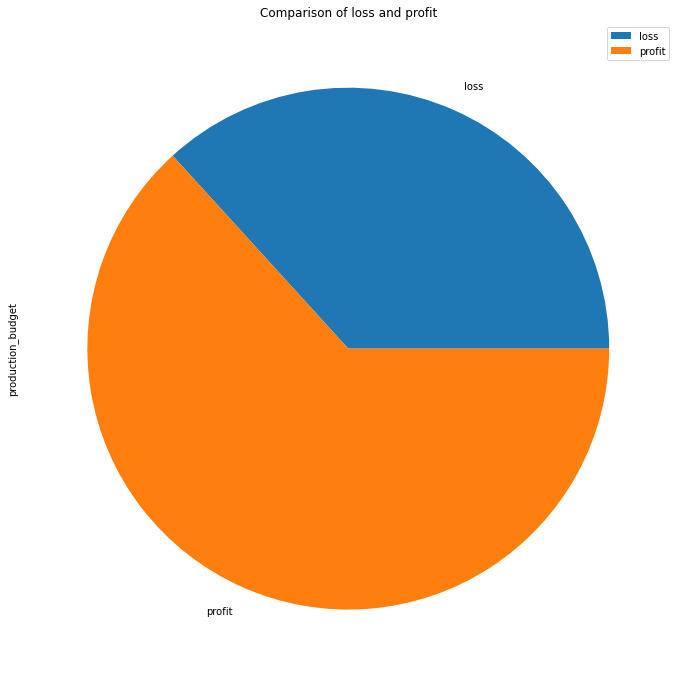

In [365]:
# Creating a pie chart to show comparison between loss and profit
aggr.plot(kind='pie',
          figsize= (15,12),
          title= 'Comparison of loss and profit',
          legend= True)

From the graph, The profit from the movie is more than the loss from the movie. 

The percentage of the company making money from the movie is higher than making a loss

# 4. Movies_info

In [368]:
# Getting the 5 rows
movie_info.head()

,synopsis,rating,genre,director,writer,theater_date,dvd_date,currency,box_office,runtime,studio
id,,,,,,,,,,,
1,"This gritty, fast-paced, and innovative police...",R,Action and Adventure|Classics|Drama,William Friedkin,Ernest Tidyman,"Oct 9, 1971","Sep 25, 2001",NaN,NaN,104 minutes,NaN
3,"New York City, not-too-distant-future: Eric Pa...",R,Drama|Science Fiction and Fantasy,David Cronenberg,David Cronenberg|Don DeLillo,"Aug 17, 2012","Jan 1, 2013",$,"600,000",108 minutes,Entertainment One
5,Illeana Douglas delivers a superb performance ...,R,Drama|Musical and Performing Arts,Allison Anders,Allison Anders,"Sep 13, 1996","Apr 18, 2000",NaN,NaN,116 minutes,NaN
6,Michael Douglas runs afoul of a treacherous su...,R,Drama|Mystery and Suspense,Barry Levinson,Paul Attanasio|Michael Crichton,"Dec 9, 1994","Aug 27, 1997",NaN,NaN,128 minutes,NaN
7,NaN,NR,Drama|Romance,Rodney Bennett,Giles Cooper,NaN,NaN,NaN,NaN,200 minutes,NaN


In [178]:
# Getting information about the dataset
movie_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1560 entries, 0 to 1559
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            1560 non-null   int64 
 1   synopsis      1498 non-null   object
 2   rating        1557 non-null   object
 3   genre         1552 non-null   object
 4   director      1361 non-null   object
 5   writer        1111 non-null   object
 6   theater_date  1201 non-null   object
 7   dvd_date      1201 non-null   object
 8   currency      340 non-null    object
 9   box_office    340 non-null    object
 10  runtime       1530 non-null   object
 11  studio        494 non-null    object
dtypes: int64(1), object(11)
memory usage: 146.4+ KB


Information about the dataset 

        1. 1560 rows
        2. 12 columns
        3. multiple missing values
        4. data types of the columns

In [179]:
# Getting the sum of missing values in the columns
movie_info.isna().sum()

id                 0
synopsis          62
rating             3
genre              8
director         199
writer           449
theater_date     359
dvd_date         359
currency        1220
box_office      1220
runtime           30
studio          1066
dtype: int64

# Cleaning data

In [180]:
# Getting the dataframe of missing values in the 'rating' column
movie_info[movie_info['rating'].isna()]

,id,synopsis,rating,genre,director,writer,theater_date,dvd_date,currency,box_office,runtime,studio
10,17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
131,167,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1543,1982,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [181]:
# Dropping the rows with missing values in the rating column
movie_info.drop(index= [10, 131, 1543], inplace= True)

In [182]:
# Setting id column as the index 
movie_info.set_index('id',inplace= True)

In [183]:
# Getting a dataframe of the missing values in the 'genre' column
movie_info[movie_info['genre'].isna()]

,synopsis,rating,genre,director,writer,theater_date,dvd_date,currency,box_office,runtime,studio
id,,,,,,,,,,,
289,NaN,NR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95 minutes,NaN
327,"When a new robot, Raymond, defeats the three h...",NR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13 minutes,NaN
843,Miners want to drill for billions of dollars w...,NR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60 minutes,NaN
1393,Steven Seagal plays an expert sniper on a spec...,R,NaN,Fred Olen Ray,Fred Olen Ray,NaN,NaN,NaN,NaN,84 minutes,NaN
1736,NaN,NR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [184]:
# Dropping the rows with missing values in the 'genre' column because the rows have almost 80% of the data missing
movie_info.drop(index= [289, 327, 843, 1393, 1736], inplace= True)

# 5. IM 

In [187]:
# Joining different tables from the im.databse
query = '''
        SELECT * 
        FROM principals
        JOIN movie_basics
        USING(movie_id)
            JOIN movie_akas
            USING(movie_id)
'''
# Saving the joined table to varible df
df = pd.read_sql(query,conn)

In [188]:
# Changing the df from sql format to dataframe format
df = pd.DataFrame(df)
# Getting the first 5 rows
df.head()

,movie_id,ordering,person_id,category,job,characters,primary_title,original_title,start_year,runtime_minutes,genres,ordering,title,region,language,types,attributes,is_original_title
0,tt0111414,1,nm0246005,actor,None,"[""The Man""]",A Thin Life,A Thin Life,2018,75.0,Comedy,1,A Thin Life,AU,None,None,None,0.0
1,tt0111414,2,nm0398271,director,None,None,A Thin Life,A Thin Life,2018,75.0,Comedy,1,A Thin Life,AU,None,None,None,0.0
2,tt0111414,3,nm3739909,producer,producer,None,A Thin Life,A Thin Life,2018,75.0,Comedy,1,A Thin Life,AU,None,None,None,0.0
3,tt0323808,10,nm0059247,editor,None,None,The Wicker Tree,The Wicker Tree,2011,96.0,"Drama,Horror",1,May Day,GB,None,working,None,0.0
4,tt0323808,10,nm0059247,editor,None,None,The Wicker Tree,The Wicker Tree,2011,96.0,"Drama,Horror",2,Cowboys for Christ,GB,None,working,None,0.0


In [189]:
# Getting information about the datset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2840284 entries, 0 to 2840283
Data columns (total 18 columns):
 #   Column             Dtype  
---  ------             -----  
 0   movie_id           object 
 1   ordering           int64  
 2   person_id          object 
 3   category           object 
 4   job                object 
 5   characters         object 
 6   primary_title      object 
 7   original_title     object 
 8   start_year         int64  
 9   runtime_minutes    float64
 10  genres             object 
 11  ordering           int64  
 12  title              object 
 13  region             object 
 14  language           object 
 15  types              object 
 16  attributes         object 
 17  is_original_title  float64
dtypes: float64(2), int64(3), object(13)
memory usage: 390.1+ MB


Information of the datset

        1. 18 columns
        2. 2840284 rows
        3. the datatypes of the column

In [190]:
# To get the sum of missing values each column
df.isna().sum()

movie_id                   0
ordering                   0
person_id                  0
category                   0
job                  2113711
characters           1736197
primary_title              0
original_title             0
start_year                 0
runtime_minutes       225191
genres                 24311
ordering                   0
title                      0
region                460696
language             2460589
types                1287742
attributes           2704344
is_original_title          0
dtype: int64

# Project DF

In [366]:
# Merging the movie dataframe and the df dataframe to a variable called project
project = movies.merge(df , how= 'inner')

In [367]:
# Getting 5 rows of the project datset
project.head()

,genre_ids,original_language,original_title,popularity,release_date,title,vote_average,vote_count,movie_id,ordering,person_id,category,job,characters,primary_title,start_year,runtime_minutes,genres,ordering,region,language,types,attributes,is_original_title
0,"[878, 28, 12]",en,Tron,12.063,1982-07-09,Tron,6.6,1100,tt1104001,10,nm0513974,writer,characters,None,TRON: Legacy,2010,125.0,"Action,Adventure,Fantasy",41,None,None,original,None,1.0
1,"[878, 28, 12]",en,Tron,12.063,1982-07-09,Tron,6.6,1100,tt1104001,1,nm0000313,actor,None,"[""Kevin Flynn"",""Clu""]",TRON: Legacy,2010,125.0,"Action,Adventure,Fantasy",41,None,None,original,None,1.0
2,"[878, 28, 12]",en,Tron,12.063,1982-07-09,Tron,6.6,1100,tt1104001,2,nm1330560,actor,None,"[""Sam Flynn""]",TRON: Legacy,2010,125.0,"Action,Adventure,Fantasy",41,None,None,original,None,1.0
3,"[878, 28, 12]",en,Tron,12.063,1982-07-09,Tron,6.6,1100,tt1104001,3,nm1312575,actress,None,"[""Quorra""]",TRON: Legacy,2010,125.0,"Action,Adventure,Fantasy",41,None,None,original,None,1.0
4,"[878, 28, 12]",en,Tron,12.063,1982-07-09,Tron,6.6,1100,tt1104001,4,nm0000310,actor,None,"[""Alan Bradley"",""Tron""]",TRON: Legacy,2010,125.0,"Action,Adventure,Fantasy",41,None,None,original,None,1.0


In [192]:
# Getting information about the dataset
project.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 356344 entries, 0 to 356343
Data columns (total 24 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   genre_ids          356344 non-null  object 
 1   original_language  356344 non-null  object 
 2   original_title     356344 non-null  object 
 3   popularity         356344 non-null  float64
 4   release_date       356344 non-null  object 
 5   title              356344 non-null  object 
 6   vote_average       356344 non-null  float64
 7   vote_count         356344 non-null  int64  
 8   movie_id           356344 non-null  object 
 9   ordering           356344 non-null  int64  
 10  person_id          356344 non-null  object 
 11  category           356344 non-null  object 
 12  job                103289 non-null  object 
 13  characters         146182 non-null  object 
 14  primary_title      356344 non-null  object 
 15  start_year         356344 non-null  int64  
 16  ru

Information of the dataset

        1. 29 columns
        2. 1031589 rows
        3. Data types of the columns
        4. Missing values 

In [193]:
# To get the number of missing values in each column
project.isna().sum()

genre_ids                 0
original_language         0
original_title            0
popularity                0
release_date              0
title                     0
vote_average              0
vote_count                0
movie_id                  0
ordering                  0
person_id                 0
category                  0
job                  253055
characters           210162
primary_title             0
start_year                0
runtime_minutes        9364
genres                  913
ordering                  0
region               104817
language             330636
types                155786
attributes           352175
is_original_title         0
dtype: int64

In [194]:
# Getting all the columns
pd.options.display.max_columns = 31

In [195]:
# Getting the number of duplicated rows
project.duplicated().value_counts()

False    331918
True      24426
dtype: int64

In [196]:
# Dropping the duplicated rows
project.drop_duplicates(keep= 'first', ignore_index= True, inplace= True)

These are not duplicates since the have some slight differences in different columns. But because the columns which are different doesn't have adequate value to the analysis. the rows will be deleted 

In [210]:
# Dropping multiple columns because they have large number of missing values
# Creting a varible that calculates the percentage % of missing data
missing_val = project.isna().sum() / len(project)

# Creating a variable that gets the columns with over 70% of missing values
col_drops = missing_val[missing_val > 0.70].index

# Droppin the columns with  over 70% of missing values
project.drop(columns= col_drops, inplace= True)

In [216]:
# Dropping the original_title and title column as the title that appears in the movie opening is the primary title
project.drop(columns= ['original_title', 'title'], inplace= True)

In [218]:
# Dropping the movie_id and person_id column as they are used as an index 
project.drop(columns= ['movie_id', 'person_id'], inplace= True)

In [233]:
conditions = [
    (project['popularity'] <= 5),
    (project['popularity'] <= 10),
    (project['popularity'] > 10)
] # Conditions of creating the new column

choice = ['not_popular', 'popular', 'very_popular'] # Choices based on the conditions of popularity column

# Creating a new column to tell how popular the movies are
project['pop_category'] = np.select(condlist= conditions,
                                    choicelist= choice,
                                    default= 'popular')



In [ ]:
# Getting a dataframe of pop_category and the genres
project.groupby('pop_category')['genres'].value_counts().unstack(fill_value=0)

genres,Action,"Action,Adventure","Action,Adventure,Animation","Action,Adventure,Biography","Action,Adventure,Comedy","Action,Adventure,Crime","Action,Adventure,Documentary","Action,Adventure,Drama","Action,Adventure,Family","Action,Adventure,Fantasy","Action,Adventure,History","Action,Adventure,Horror","Action,Adventure,Mystery","Action,Adventure,Romance","Action,Adventure,Sci-Fi",...,Romance,"Romance,Sci-Fi","Romance,Sci-Fi,Thriller","Romance,Sport","Romance,Thriller",Sci-Fi,"Sci-Fi,Thriller",Sport,"Sport,Thriller",Talk-Show,Thriller,"Thriller,War","Thriller,Western",War,Western
pop_category,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
not_popular,1560,211,248,80,756,310,134,710,64,439,50,379,28,20,596,...,552,8,120,18,67,1076,487,152,20,7,6144,8,0,90,390
popular,362,110,130,10,570,120,27,570,100,180,20,202,0,20,160,...,73,60,20,0,72,188,200,34,0,0,937,30,77,0,57
very_popular,93,20,670,280,1500,450,0,1630,200,1982,0,304,90,10,3470,...,59,0,30,0,0,9,120,0,0,0,267,0,10,0,10


In [ ]:
# Top ten genres in movies by their popularity
project.groupby('genres')['pop_category'].value_counts(ascending= False).unstack(fill_value=0).nlargest(columns= ['not_popular', 'popular', 'very_popular'], n= 10)

pop_category,not_popular,popular,very_popular
genres,,,
Drama,23322,6832,2325
Documentary,17713,2181,473
Horror,8521,1838,405
Comedy,8235,2841,1525
"Comedy,Drama",6274,4167,1038
"Horror,Thriller",6186,2421,1183
Thriller,6144,937,267
"Drama,Romance",4234,3009,1482
"Comedy,Drama,Romance",3961,3537,1482


In [276]:
# Creating a varible of how popular  gernes in movie are based on very_popular category 
genre_pop = project.groupby('genres')['pop_category'].value_counts(ascending= False).unstack(fill_value=0).nlargest(columns= ['very_popular'], n= 10)

fig = px.bar(data_frame= genre_pop,
             title= 'Top 10 Genre Popularity')
fig.show()

From the graph Action,Adventures, Sci-Fi movies are the very popular among all the genres. However they are not popular. They are either very popular or not popular

Drama, Comedy, (Comedy,Drama,Romance) movie genres are the most balanced movie genre. They are very popular, popular but still not popular

For movie making (Action,Adventures,Sci-Fi),Drama, Comedy are worth making since they have a large percentage of popularity in the market 

In [ ]:
# Knowing the number of missing values in the runtime_minutes column
project['runtime_minutes'].isna().value_counts()

False    322887
True       9031
Name: runtime_minutes, dtype: int64

In [296]:
# Getting the mean of the runtime_minutes
time_mean = project['runtime_minutes'].mean()

# Replacing the missing values in the runtime_minutes column with the mean
project['runtime_minutes'] = project['runtime_minutes'].replace(np.nan, value= time_mean)

In [298]:
# Getting a statistical summary of the runtime_minutes
fig = px.box(data_frame= project['runtime_minutes'],
             title= 'Runtime boxplot')

fig.show()

From the graph we can get the following 

            1. median = 95 
            2. q3 = 106
            3. q1 = 87
            4. lowest runtime_minutes = 1
            5. highest runtime_minutes = 1834


From this average movie should be between 87 minutes and 106 minutes. Within 1hr 30 mins to 2hrs 

Higher or lower than this it will be extreme and could lead to 

    (a) Losing focus on the movie if it's too long
    (b) Not having a good plot if it's too short

In [333]:
# Getting top 10 regions with the highest number of movies
project['region'].value_counts().nlargest(10)

US     112562
GB      13735
CA      12519
FR       8563
XWW      7639
ES       7508
DE       6876
IT       4658
GR       4281
AU       3750
Name: region, dtype: int64

<AxesSubplot:title={'center':'Top 10 regions with highest movies'}>

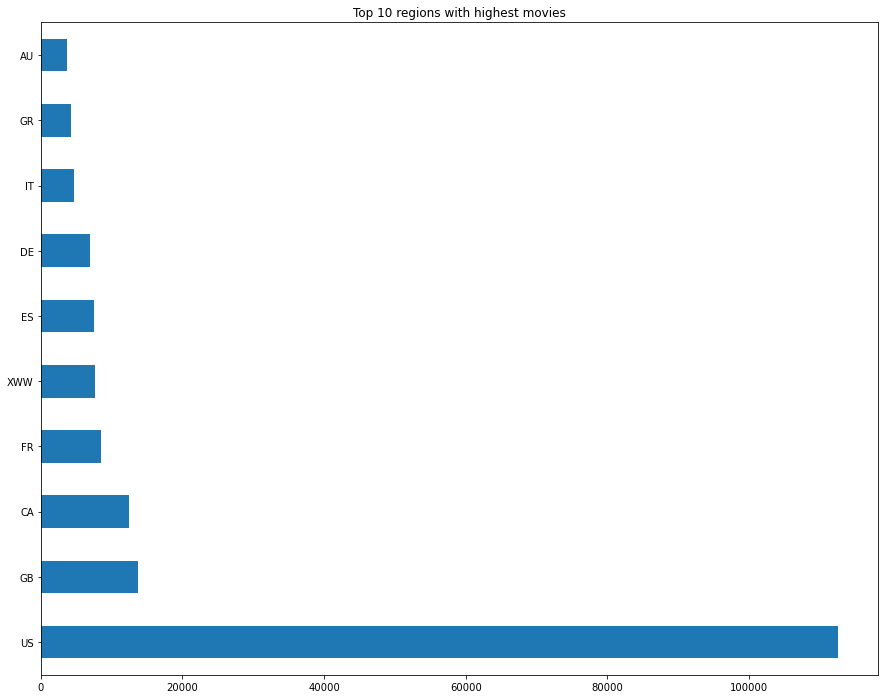

In [332]:
# Getting a visualization of top 10 regions with the highest number of movies
project['region'].value_counts().nlargest(10).plot(kind= 'barh',
                                                   figsize=(15,12),
                                                   title= 'Top 10 regions with highest movies')

This graph helps in knowing the regions to target the movie at.

Movies created focusing on these regions are more likely to generate profit since the regions have a movie culture.

In [346]:
project.groupby('genres')['region'].value_counts().nlargest(10)

genres                region
Drama                 US        11190
Documentary           US         9689
Comedy                US         5725
Horror                US         5481
Comedy,Drama          US         4233
Horror,Thriller       US         3908
Thriller              US         3255
Comedy,Drama,Romance  US         3138
Drama,Romance         US         2243
Drama,Thriller        US         2183
Name: region, dtype: int64

<AxesSubplot:title={'center':'Top 10 genres in regions'}, xlabel='genres,region'>

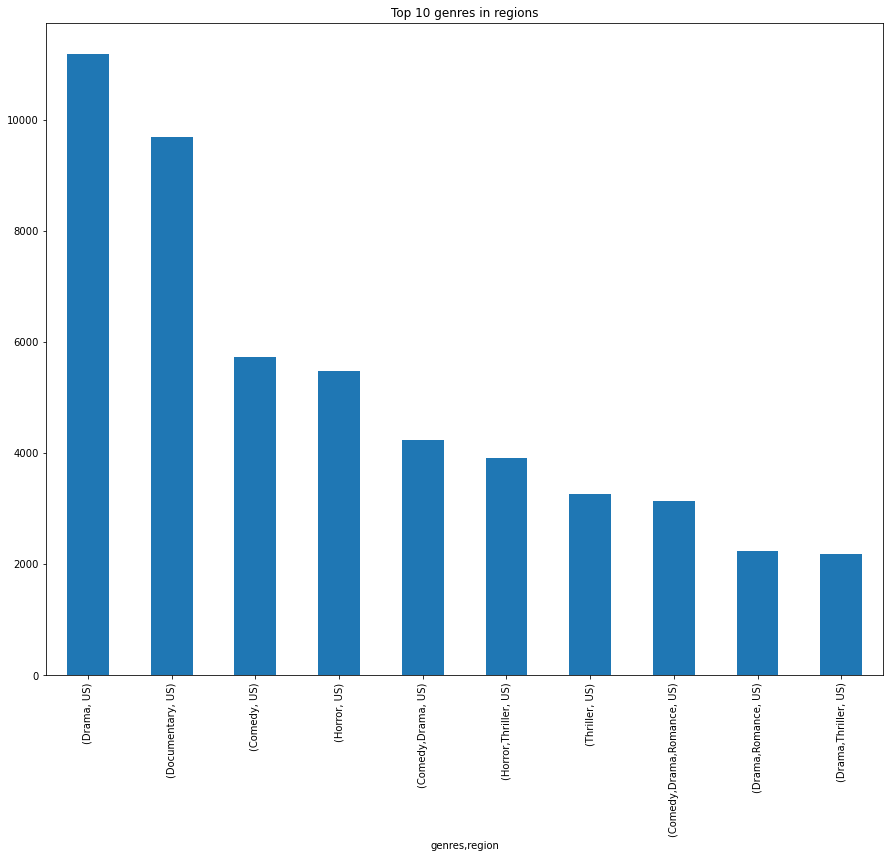

In [349]:
project.groupby('genres')['region'].value_counts().nlargest(10).plot(kind= 'bar',
                                                                     figsize=(15,12),
                                                                     title= 'Top 10 genres in regions')

From the graph, it shows that United States of America has a larger market for movies because many genres are popular in the country.

This creates a large market for movies.

To create a profitable movie, target the US market since it has high number of customers due to their movie culture.

# Recommendations

1. For the market, The company should focus on the mostly the United States of America because it has a high movie culture and very large market for various movies genres


2. For the genres, The comapany should focus on (Action,Adventures,Sci-Fi),Drama, Comedy genres since they perform well in the movie industry and are more likely to be popular. They tend to reach more people hence high profit of for the company

3. For the movie runtime, The company should create movies ranging from 1hr 30mins to 2hrs. This will prevent the risk of having a very poor plot if the movie is short and boring the viewers if it's too long

4. For the cost, The company should use a budget of range 5m to 40m. This is to avoid great losses since it's a startup company.